<a href="https://colab.research.google.com/github/AlaaElnakeeb81536/AlaaElnakeeb81536/blob/main/final_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

:::# <center> [1] import libraries 

In [ ]:
import numpy as np # linear algebra
import pandas as pd # Data _ preprocessing
import math
import matplotlib.pyplot as plt # Data _ Visualization
import seaborn as sns # Data _ Visualization
from sklearn.tree import plot_tree
# library to divide the dataset into training data and testing data
from sklearn.model_selection import train_test_split
#library to calculate model performance
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report,precision_score,recall_score , f1_score

# <center>  [2] understanding data

In [ ]:
#load our data set 
data = pd.read_csv("data.csv")
data.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [ ]:
#Get some information about the data for the processing process
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [ ]:
data.shape

(569, 33)

In [ ]:
data.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,0.0
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,NaN
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,NaN
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,NaN
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,NaN
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,NaN
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,NaN
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,NaN


In [ ]:
data.drop('id' , axis=1, inplace=True)

In [ ]:
data

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,NaN
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,NaN
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,NaN
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,NaN
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,NaN
565,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,NaN
566,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,NaN
567,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,NaN


#  <center>  [3] Exploratory Data Analysis (EDA)

# <center>  3.1. Univariate Analysis

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN



Inference: The Datset consists of 32 features & 569 samples.
            Target Variable Distribution           


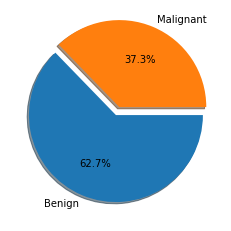

In [ ]:
# An abstract about our data set
target = 'diagnosis'
labels = ['Benign','Malignant']
features = [i for i in data.columns.values if i not in [target]]

original_df = data.copy(deep=True)
display(data.head())

print('\n\033[1mInference:\033[0m The Datset consists of {} features & {} samples.'.format(data.shape[1], data.shape[0]))
#Let us first analyze the distribution of the target variable

MAP={}
for e, i in enumerate(sorted(data[target].unique())):
    MAP[i]=labels[e]
#MAP={0:'Not-Survived',1:'Survived'}
df1 = data.copy()
df1[target]=df1[target].map(MAP)
explode=np.zeros(len(labels))
explode[-1]=0.1
print('\033[1mTarget Variable Distribution'.center(55))
plt.pie(df1[target].value_counts(), labels=df1[target].value_counts().index, counterclock=False, shadow=True, 
        explode=explode, autopct='%1.1f%%', radius=1, startangle=0)
plt.show()

<AxesSubplot:>

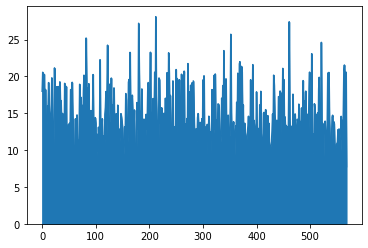

In [ ]:
data.radius_mean.plot(kind = "area")

<AxesSubplot:>

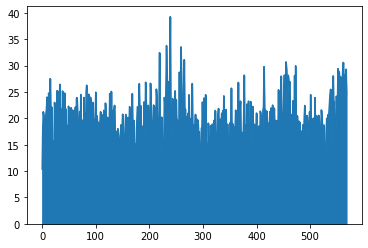

In [ ]:
data.texture_mean.plot(kind = 'area')

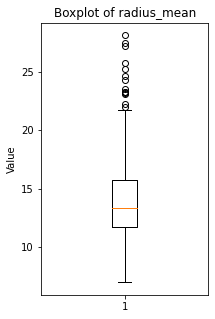

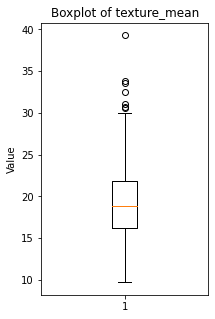

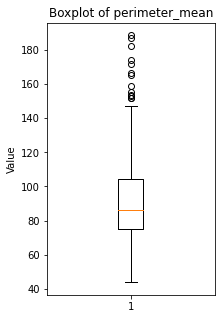

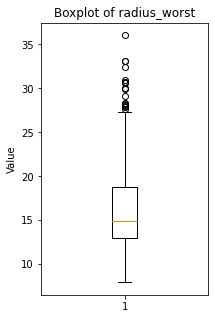

In [ ]:
#Boxplot of radius_mean
plt.figure(figsize=(3,5))
plt.boxplot(data["radius_mean"])
plt.title('Boxplot of ' + "radius_mean")
plt.ylabel('Value')
plt.show()
#Boxplot of texture_mean
plt.figure(figsize=(3,5))
plt.boxplot(data["texture_mean"])
plt.title('Boxplot of ' + "texture_mean")
plt.ylabel('Value')
plt.show()
#Boxplot of perimeter_mean
plt.figure(figsize=(3,5))
plt.boxplot(data["perimeter_mean"])
plt.title('Boxplot of ' + "perimeter_mean")
plt.ylabel('Value')
plt.show()
#Boxplot of radius_worst
plt.figure(figsize=(3,5))
plt.boxplot(data["radius_worst"])
plt.title('Boxplot of ' + "radius_worst")
plt.ylabel('Value')
plt.show()

# <center> 3.2. Bivariate Analysis

<AxesSubplot:xlabel='radius_mean', ylabel='perimeter_mean'>

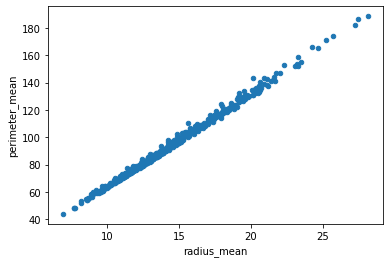

In [ ]:
data.plot(x = 'radius_mean' , y = 'perimeter_mean' ,  kind = 'scatter' )

<AxesSubplot:xlabel='radius_mean', ylabel='perimeter_mean'>

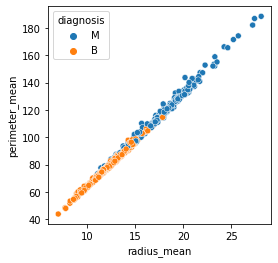

In [ ]:
plt.figure(figsize=(4,4))
sns.scatterplot(x=data['radius_mean'], y=data['perimeter_mean'], hue=data['diagnosis'])

**There is a perfect positive relationship between radius_mean and perimeter_mean.**

The increase that occurred in radius_mean was also followed by an increase in perimeter_mean.

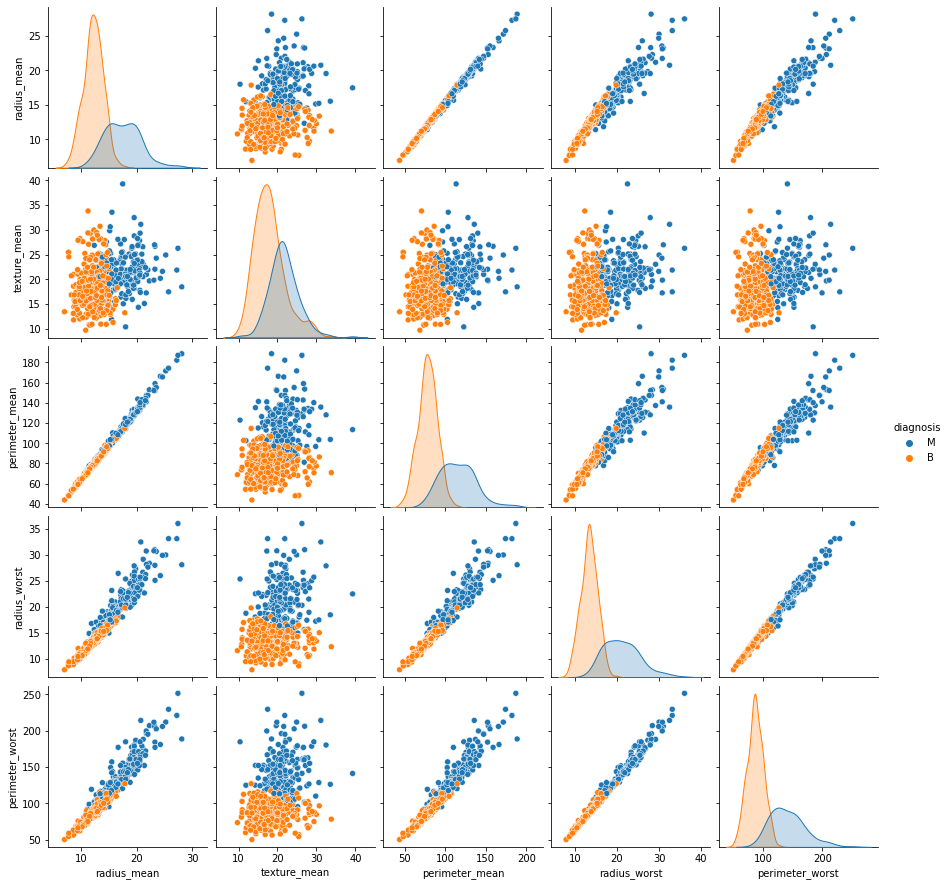

In [ ]:
sns.pairplot(data, hue="diagnosis", vars=["radius_mean", "texture_mean", "perimeter_mean", "radius_worst", "perimeter_worst"])
plt.show()

# <center>  3.3. Multivariate Analysis

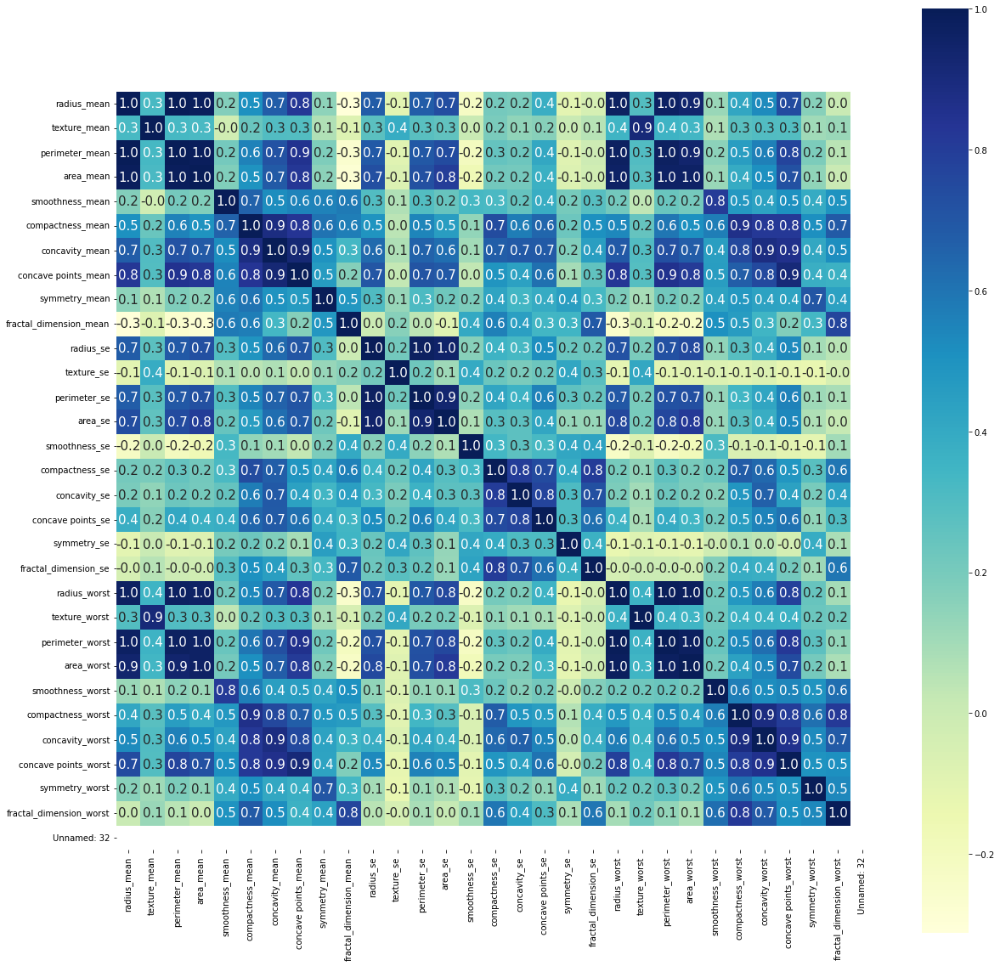

In [ ]:
#Get the correlation between features

plt.figure(figsize=(20,20))
sns.heatmap(data.corr(), cbar=True, square=True, fmt='.1f', annot=True, annot_kws={'size':15}, cmap='YlGnBu')
plt.show()

<Figure size 2160x2160 with 0 Axes>

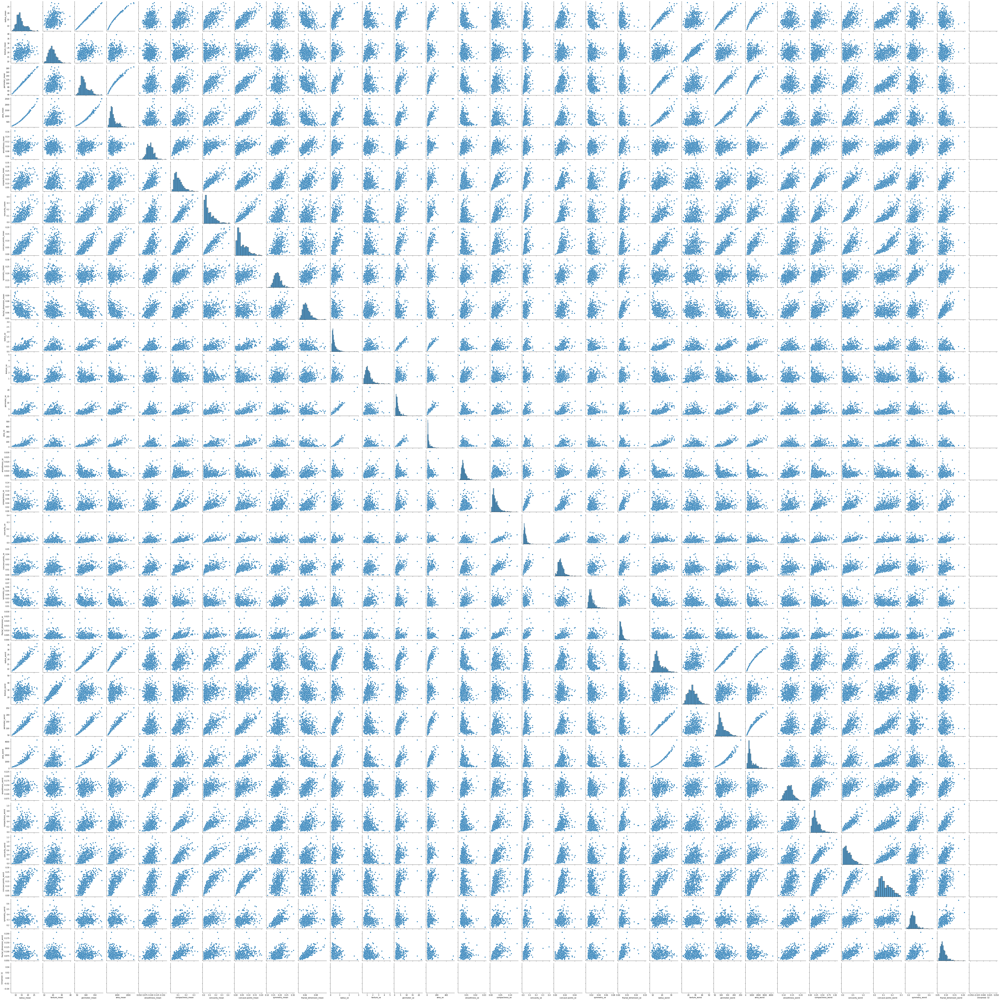

In [ ]:
plt.figure(figsize=(30,30))
sns.pairplot(data)

# <center> Data Preproccessing 

In [ ]:
# Convert categorical features to numerical
data.diagnosis = [1 if patient == "M" else 0 for patient in data.diagnosis ]

In [ ]:
data

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,NaN
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,NaN
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,NaN
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,NaN
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,1,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,NaN
565,1,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,NaN
566,1,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,NaN
567,1,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,NaN


In [ ]:
x = data.drop(columns='diagnosis' ,axis=1)
x.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [ ]:
x = x.drop(columns='Unnamed: 32' , axis=1)
x.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [ ]:
y = data.diagnosis.values

In [ ]:
# Separate data into training data and testing data, with a proportion of 80% training data, and 20% testing data
xtrain , xtest , ytrain , ytest = train_test_split(x , y , train_size=0.8 , test_size= 0.2 , random_state=42 )

print('data training:' ,xtrain.shape , "," , ytrain.shape )
print('data training:' ,xtest.shape , "," , ytest.shape )

data training: (455, 30) , (455,)
data training: (114, 30) , (114,)


In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
#standralization the data between [0-1]
st_x = StandardScaler()
xtrain = st_x.fit_transform(xtrain)
xtest = st_x.fit_transform(xtest)

# Performance Equations : 

$Accuracy = \frac{(TP + TN)}{(TN + FP + TP + FN)}$             



$Recall = \frac{TP}{(TP + FN)}$



$Precision = \frac{TP}{(TP + FP)}$


$F1 - Score = \frac{(2TP)}{(FP + 2TP + FN)}$

# <center> 1. k-NN Algorithm

In [ ]:
# import library k-NN
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
# using the k-NN algorithm, with the value of k being 5, calculating the euclidean distance (p=2)
knn = KNeighborsClassifier(n_neighbors=5, weights='distance', p=2, metric='minkowski')
knn.fit(xtrain, ytrain)
pred = knn.predict(xtest)

# Apply evaluation metrics to assess a model's performance
k_NN_Training_Accuracy = knn.score(xtrain, ytrain)*100
k_NN_Test_Accuracy = round(accuracy_score(ytest, pred)*100 , 3)
k_NN_precision_Score = round(precision_score(ytest, pred)*100 , 3)
k_NN_Recall_Score = round(recall_score(ytest ,pred)*100 , 3)
k_NN_F1_Score = round(f1_score(ytest ,pred)*100 , 3)


KNN = pd.Series({"k-NN Training Accuracy" :k_NN_Training_Accuracy,
               "k-NN Test Accuracy" : k_NN_Test_Accuracy,
                "k-NN precision Score" : k_NN_precision_Score,
                "k-NN Recall Score" : k_NN_Recall_Score,
                "k-NN F1 Score" :k_NN_F1_Score })
KNN_Schedule = pd.DataFrame({"Best Score" : KNN})
KNN_Schedule

,Best Score
k-NN Training Accuracy,100.000
k-NN Test Accuracy,95.614
k-NN precision Score,95.238
k-NN Recall Score,93.023
k-NN F1 Score,94.118


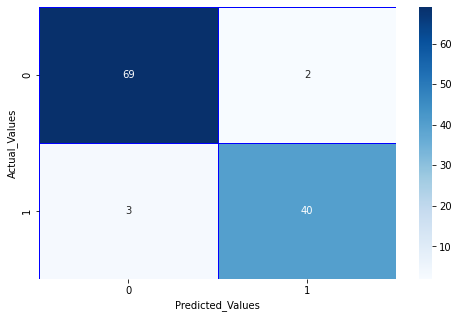

In [ ]:
# show confusion matrix to assess the algorithm performance
cm = confusion_matrix(ytest,pred)
f , ax = plt.subplots(figsize = (8,5))
sns.heatmap(cm , annot = True , linewidths = 0.5 , linecolor = 'blue' , fmt = ".0f" , ax = ax , cmap = 'Blues')
plt.xlabel("Predicted_Values")
plt.ylabel("Actual_Values")
plt.show()

In [ ]:
print(classification_report(ytest , pred))

              precision    recall  f1-score   support

           0       0.96      0.97      0.97        71
           1       0.95      0.93      0.94        43

    accuracy                           0.96       114
   macro avg       0.96      0.95      0.95       114
weighted avg       0.96      0.96      0.96       114



# <center> 2. Naive Bayes Algorithm

In [ ]:
# import library Naive Bayes Gaussian
from sklearn.naive_bayes import GaussianNB

In [ ]:
# using the Naive Bayes algorithm
nb = GaussianNB()
nb.fit(xtrain,ytrain)
ypred = nb.predict(xtest)

# Apply evaluation metrics to assess a model's performance
Naive_Bayes_Training_Accuracy = round(nb.score(xtrain, ytrain)*100 , 3)
Naive_Bayes_Test_Accuracy = round(accuracy_score(ytest, ypred)*100, 3)
Naive_Bayes_precision_Score = round(precision_score(ytest, ypred)*100, 3)
Naive_Bayes_Recall_Score = round(recall_score(ytest, ypred)*100, 3)
Naive_Bayes_F1_Score = round(f1_score(ytest, ypred)*100, 3)


NB = pd.Series({"Naive Bayes Training Accuracy" :Naive_Bayes_Training_Accuracy,
                "Naive Bayes Test Accuracy" : Naive_Bayes_Test_Accuracy,
                "Naive Bayes precision Score" : Naive_Bayes_precision_Score,
                "Naive Bayes Racall Score" : Naive_Bayes_Recall_Score,
                "Naive Bayes F1 Score" :Naive_Bayes_F1_Score })
NB_Schedule = pd.DataFrame({"Best Score" : NB})
NB_Schedule

,Best Score
Naive Bayes Training Accuracy,93.626
Naive Bayes Test Accuracy,95.614
Naive Bayes precision Score,97.500
Naive Bayes Racall Score,90.698
Naive Bayes F1 Score,93.976


confusion matrix


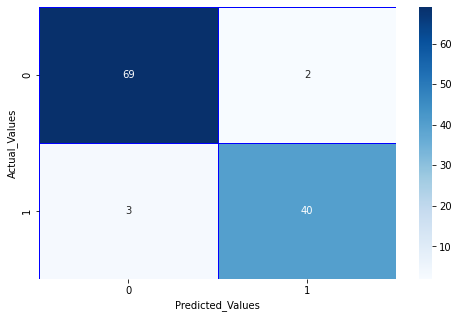

In [ ]:
# show confusion matrix to assess the algorithm performance
print('confusion matrix')
cm = confusion_matrix(ytest , pred)
f , ax = plt.subplots(figsize = (8,5))
sns.heatmap(cm , annot = True , linewidths = 0.5 , linecolor = "Blue" , cmap = "Blues" , ax = ax , fmt = ".0f")
plt.xlabel("Predicted_Values")
plt.ylabel("Actual_Values")
plt.show()

In [ ]:
print(classification_report(ytest , pred))

              precision    recall  f1-score   support

           0       0.96      0.97      0.97        71
           1       0.95      0.93      0.94        43

    accuracy                           0.96       114
   macro avg       0.96      0.95      0.95       114
weighted avg       0.96      0.96      0.96       114



# <center> 3. Decision Tree Algorithm

In [ ]:
# import library Decision Tree
from sklearn.tree import DecisionTreeClassifier

In [ ]:
# using the Decision Tree algorithm
dt = DecisionTreeClassifier()
dt.fit(xtrain, ytrain)
ypred = dt.predict(xtest)

# Apply evaluation metrics to assess a model's performance
Decision_Tree_Training_Accuracy = round(dt.score(xtrain, ytrain)*100 , 3)
Decision_Tree_Test_Accuracy = round(accuracy_score(ytest, ypred)*100, 3)
Decision_Tree_precision_Score = round(precision_score(ytest, ypred)*100, 3)
Decision_Tree_Recall_Score = round(recall_score(ytest, ypred)*100, 3)
Decision_Tree_F1_Score = round(f1_score(ytest, ypred)*100, 3)


DT = pd.Series({"Decision Tree Training Accuracy" :Decision_Tree_Training_Accuracy,
                "Decision Tree Test Accuracy" : Decision_Tree_Test_Accuracy,
                "Decision Tree precision Score" : Decision_Tree_precision_Score,
                "Decision Tree Racall Score" : Decision_Tree_Recall_Score,
                "Decision Tree F1 Score" :Decision_Tree_F1_Score })
DT_Schedule = pd.DataFrame({"Best Score" : DT})
DT_Schedule

,Best Score
Decision Tree Training Accuracy,100.000
Decision Tree Test Accuracy,87.719
Decision Tree precision Score,83.721
Decision Tree Racall Score,83.721
Decision Tree F1 Score,83.721


confusion matrix


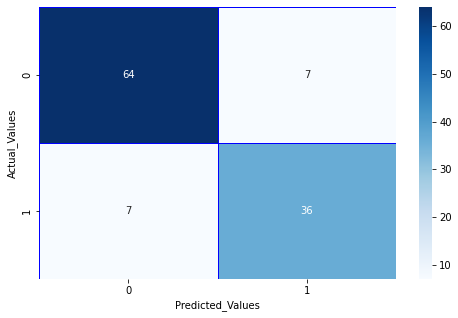

In [ ]:
# show confusion matrix to assess the algorithm performance
print('confusion matrix')
cm = confusion_matrix(ytest,ypred)
f , ax = plt.subplots(figsize = (8,5))
sns.heatmap(cm , annot = True , ax = ax , linewidths = 0.5 , linecolor = "Blue" , cmap = "Blues" , fmt = ".0f" )
plt.xlabel("Predicted_Values")
plt.ylabel("Actual_Values")
plt.show()

In [ ]:
print(classification_report(ytest , ypred))

              precision    recall  f1-score   support

           0       0.90      0.90      0.90        71
           1       0.84      0.84      0.84        43

    accuracy                           0.88       114
   macro avg       0.87      0.87      0.87       114
weighted avg       0.88      0.88      0.88       114



[Text(0.6145833333333334, 0.9375, 'concavity_mean <= 0.079\ngini = 0.467\nsamples = 455\nvalue = [286, 169]\nclass = 0'),
 Text(0.3958333333333333, 0.8125, 'fractal_dimension_se <= 0.124\ngini = 0.107\nsamples = 282\nvalue = [266, 16]\nclass = 0'),
 Text(0.2916666666666667, 0.6875, 'perimeter_se <= 0.183\ngini = 0.037\nsamples = 263\nvalue = [258, 5]\nclass = 0'),
 Text(0.20833333333333334, 0.5625, 'area_worst <= 2.0\ngini = 0.023\nsamples = 260\nvalue = [257, 3]\nclass = 0'),
 Text(0.16666666666666666, 0.4375, 'area_se <= -1.205\ngini = 0.015\nsamples = 259\nvalue = [257, 2]\nclass = 0'),
 Text(0.08333333333333333, 0.3125, 'symmetry_se <= -0.897\ngini = 0.245\nsamples = 7\nvalue = [6, 1]\nclass = 0'),
 Text(0.041666666666666664, 0.1875, 'gini = 0.0\nsamples = 1\nvalue = [0, 1]\nclass = 1'),
 Text(0.125, 0.1875, 'gini = 0.0\nsamples = 6\nvalue = [6, 0]\nclass = 0'),
 Text(0.25, 0.3125, 'radius_worst <= 1.29\ngini = 0.008\nsamples = 252\nvalue = [251, 1]\nclass = 0'),
 Text(0.2083333333

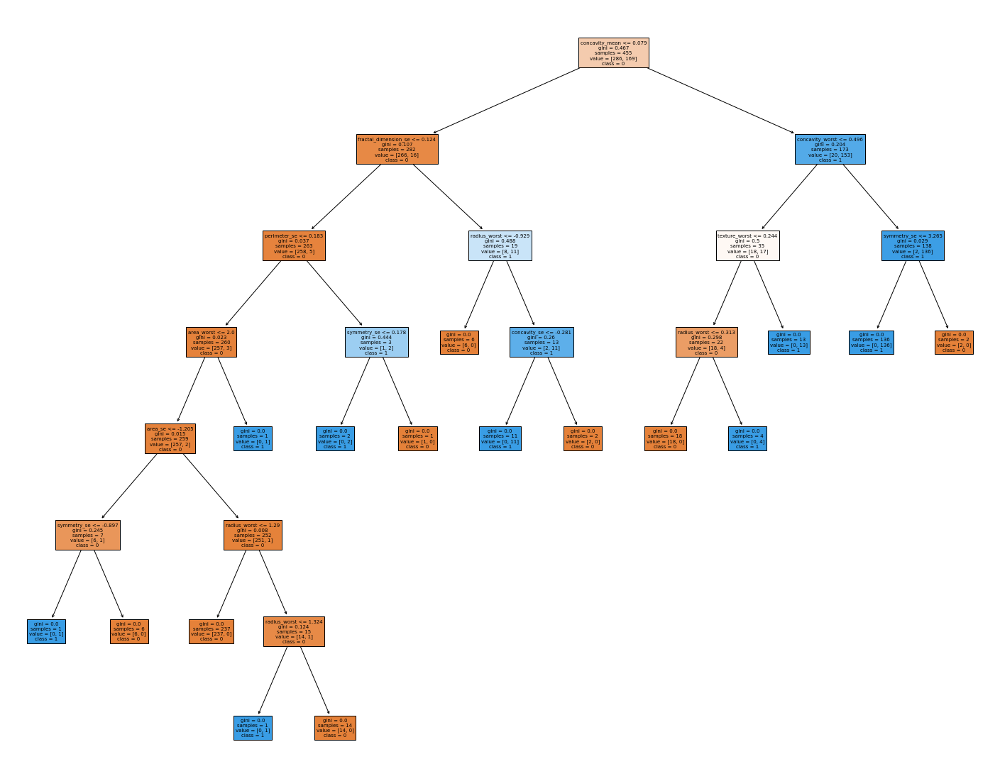

In [ ]:
fig = plt.figure(figsize=(25,20))
DT_data = pd.read_csv("data.csv")
DT_data = DT_data.drop(columns=["Unnamed: 32" , "id"])
plot_tree(dt , feature_names=[i for i in DT_data.columns] , filled=True , class_names=['0', '1'])

# <center> 4. Support Vector Machine Algorithm

In [ ]:
# import library Support Vestor Machine
from sklearn.svm import SVC

In [ ]:
"""# using the Decision Tree algorithm
svm = SVC(C=1, kernel='rbf', gamma='scale')
svm.fit(xtrain, ytrain)
ypred = svm.predict(xtest)"""
SV = SVC(probability=True, random_state=10) 
SV.fit(xtrain, ytrain)
ypred = SV.predict(xtest)

# Apply evaluation metrics to assess a model's performance
SVM_Classifier_Training_Accuracy = round(SV.score(xtrain, ytrain)*100 , 3)
SVM_Classifier_Test_Accuracy = round(accuracy_score(ytest, ypred)*100, 3)
SVM_Classifier_precision_Score = round(precision_score(ytest, ypred)*100, 3)
SVM_Classifier_Recall_Score = round(recall_score(ytest, ypred)*100, 3)
SVM_Classifier_F1_Score = round(f1_score(ytest, ypred)*100, 3)


SVM = pd.Series({"SVM Classifier Training Accuracy" :SVM_Classifier_Training_Accuracy,
                "SVM Classifier Test Accuracy" : SVM_Classifier_Test_Accuracy,
               "SVM Classifier precision Score" : SVM_Classifier_precision_Score,
                "SVM Classifier Racall Score" : SVM_Classifier_Recall_Score,
               "SVM Classifier F1 Score" : SVM_Classifier_F1_Score })
SVM_Schedule = pd.DataFrame({"Best Score" : SVM})
SVM_Schedule

,Best Score
SVM Classifier Training Accuracy,98.901
SVM Classifier Test Accuracy,98.246
SVM Classifier precision Score,100.000
SVM Classifier Racall Score,95.349
SVM Classifier F1 Score,97.619


confusion matrix


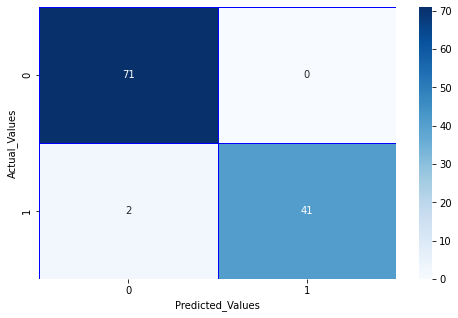

In [ ]:
# show confusion matrix to assess the algorithm performance
print('confusion matrix')
cm = confusion_matrix(ytest,ypred)
f , ax = plt.subplots(figsize = (8,5))
sns.heatmap(cm , ax = ax , linecolor = "Blue" , linewidths = 0.5 , fmt = ".0f" , cmap = "Blues" , annot = True)
plt.xlabel("Predicted_Values")
plt.ylabel("Actual_Values")
plt.show()

In [ ]:
print(classification_report(ytest , ypred))

              precision    recall  f1-score   support

           0       0.97      1.00      0.99        71
           1       1.00      0.95      0.98        43

    accuracy                           0.98       114
   macro avg       0.99      0.98      0.98       114
weighted avg       0.98      0.98      0.98       114



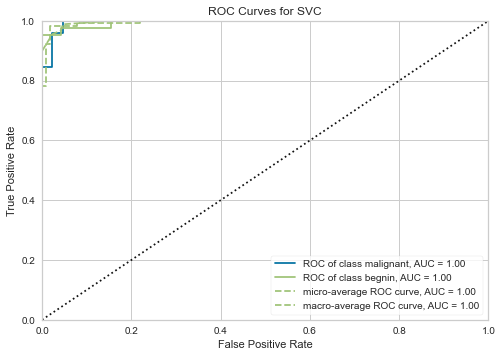

<AxesSubplot:title={'center':'ROC Curves for SVC'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [ ]:
from yellowbrick.classifier import ROCAUC
# Create ROCAUC visualization
visualizer = ROCAUC(SV , classes=["malignant", "begnin"] )

# Fit visualization on test data
visualizer.fit(xtrain, ytrain)
visualizer.score(xtest, ytest)

# Show visualization
visualizer.show()

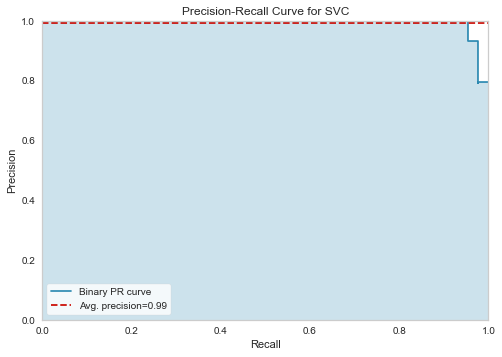

<AxesSubplot:title={'center':'Precision-Recall Curve for SVC'}, xlabel='Recall', ylabel='Precision'>

In [ ]:
from yellowbrick.classifier import PrecisionRecallCurve

# Create ROCAUC visualization
visualizer = PrecisionRecallCurve(SV , classes=["malignant", "begnin"] )

# Fit visualization on test data
visualizer.fit(xtrain, ytrain)
visualizer.score(xtest, ytest)

# Show visualization
visualizer.show()

# <center>5. Logistic Regression Algorithm

In [ ]:
#logistic regression
from sklearn.linear_model import LogisticRegression
logmode=LogisticRegression()
logmode.fit(xtrain,ytrain)
pred=logmode.predict(xtest)

# Apply evaluation metrics to assess a model's performance
Logistic_Regression_Training_Accuracy = round(logmode.score(xtrain, ytrain)*100 , 3)
Logistic_Regression_Test_Accuracy = round(accuracy_score(ytest, pred)*100 , 3)
Logistic_Regression_precision_Score = round(precision_score(ytest, pred)*100 , 3)
Logistic_Regression_Recall_Score = round(recall_score(ytest ,pred)*100 , 3)
Logistic_Regression_F1_Score = round(f1_score(ytest ,pred)*100 , 3)


LG = pd.Series({"Logistic Regression Training Accuracy" :Logistic_Regression_Training_Accuracy,
                "Logistic Regression Test Accuracy" : Logistic_Regression_Test_Accuracy,
                "Logistic Regression precision Score" : Logistic_Regression_precision_Score,
                "Logistic Regression Recall Score" : Logistic_Regression_Recall_Score,
                "Logistic Regression F1 Score" :Logistic_Regression_F1_Score })
LG_Schedule = pd.DataFrame({"Best Score" : LG})
LG_Schedule

,Best Score
Logistic Regression Training Accuracy,98.681
Logistic Regression Test Accuracy,98.246
Logistic Regression precision Score,100.000
Logistic Regression Recall Score,95.349
Logistic Regression F1 Score,97.619


confusion matrix witout normalization


C:\Users\FreeComp\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


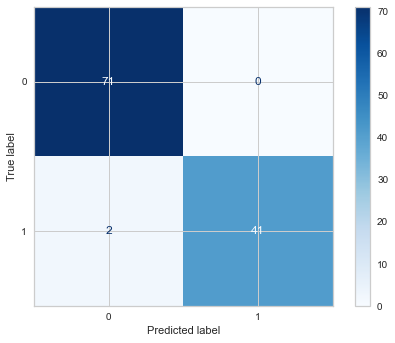

confusion matrix wit normalization


C:\Users\FreeComp\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


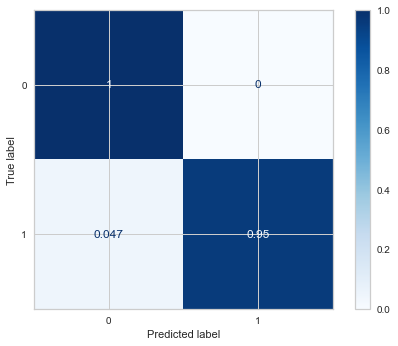

In [ ]:
# show confusion matrix to assess the algorithm performance
from sklearn.metrics import plot_confusion_matrix
print('confusion matrix witout normalization')
plot_confusion_matrix(logmode,xtest,ytest,cmap='Blues')
plt.show()

print('confusion matrix wit normalization')
plot_confusion_matrix(logmode,xtest,ytest,normalize='true',cmap='Blues')
plt.show()

In [ ]:
print(classification_report(ytest,pred))

              precision    recall  f1-score   support

           0       0.97      1.00      0.99        71
           1       1.00      0.95      0.98        43

    accuracy                           0.98       114
   macro avg       0.99      0.98      0.98       114
weighted avg       0.98      0.98      0.98       114



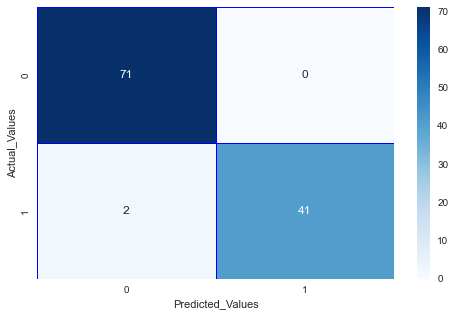

In [ ]:
# show confusion matrix to assess the algorithm performance
cm = confusion_matrix(ytest,pred)
f , ax = plt.subplots(figsize = (8,5))
sns.heatmap(cm , ax = ax , linecolor = "Blue" , linewidths = 0.5 , fmt = ".0f" , cmap = "Blues" , annot = True)
plt.xlabel("Predicted_Values")
plt.ylabel("Actual_Values")
plt.show()

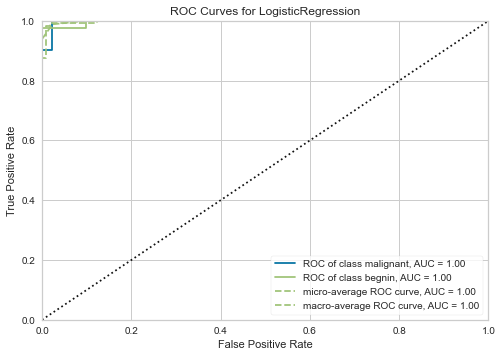

<AxesSubplot:title={'center':'ROC Curves for LogisticRegression'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [ ]:
# Create ROCAUC visualization
visualizer = ROCAUC(logmode , classes=["malignant", "begnin"] )

# Fit visualization on test data
visualizer.fit(xtrain, ytrain)
visualizer.score(xtest, ytest)

# Show visualization
visualizer.show()

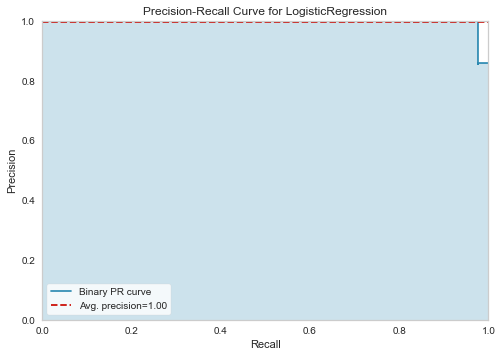

<AxesSubplot:title={'center':'Precision-Recall Curve for LogisticRegression'}, xlabel='Recall', ylabel='Precision'>

In [ ]:
# Create ROCAUC visualization
visualizer = PrecisionRecallCurve(logmode , classes=["malignant", "begnin"] )

# Fit visualization on test data
visualizer.fit(xtrain, ytrain)
visualizer.score(xtest, ytest)

# Show visualization
visualizer.show()

# <center> 6.   Random Forest Algorithm

In [ ]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators= 1000, random_state = 1)
rf.fit(xtrain, ytrain)
ypred = rf.predict(xtest)

# Apply evaluation metrics to assess a model's performance
Random_Forest_Training_Accuracy = round(rf.score(xtrain, ytrain)*100 , 3)
Random_Forest_Test_Accuracy = round(accuracy_score(ytest, ypred)*100, 3)
Random_Forest_precision_Score = round(precision_score(ytest, ypred)*100, 3)
Random_Forest_Recall_Score = round(recall_score(ytest, ypred)*100, 3)
Random_Forest_F1_Score = round(f1_score(ytest, ypred)*100, 3)


RF = pd.Series({"SVM Classifier Training Accuracy" :Random_Forest_Training_Accuracy,
                "SVM Classifier Test Accuracy" : Random_Forest_Test_Accuracy,
                "SVM Classifier precision Score" : Random_Forest_precision_Score,
                "SVM Classifier Racall Score" : Random_Forest_Recall_Score,
                "SVM Classifier F1 Score" : Random_Forest_F1_Score })
RF_Schedule = pd.DataFrame({"Best Score" : RF})
RF_Schedule

,Best Score
SVM Classifier Training Accuracy,100.000
SVM Classifier Test Accuracy,96.491
SVM Classifier precision Score,97.561
SVM Classifier Racall Score,93.023
SVM Classifier F1 Score,95.238


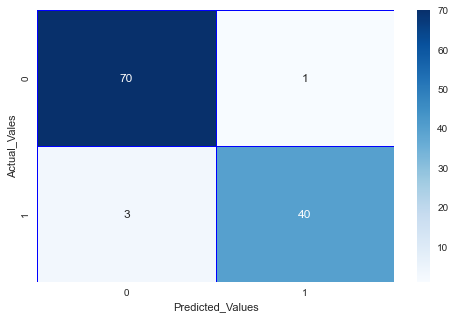

In [ ]:
# show confusion matrix to assess the algorithm performance
cm = confusion_matrix(ytest , ypred)
f , ax = plt.subplots(figsize = (8,5))
sns.heatmap(cm , ax = ax , annot=True , cmap="Blues" , linecolor="Blue" , linewidths=0.5 , fmt=".0f")
plt.xlabel("Predicted_Values")
plt.ylabel("Actual_Vales")
plt.show()

In [ ]:
print(classification_report(ytest , ypred))

              precision    recall  f1-score   support

           0       0.96      0.99      0.97        71
           1       0.98      0.93      0.95        43

    accuracy                           0.96       114
   macro avg       0.97      0.96      0.96       114
weighted avg       0.97      0.96      0.96       114



In [ ]:
training_accuracy = pd.Series({"k-NN Algorithm" : k_NN_Training_Accuracy,
                               "Naive Bayes Algorithm" :Naive_Bayes_Training_Accuracy ,
                              "Decision Tree Algorithm" :Decision_Tree_Training_Accuracy,
                              "Support Vector Machine Algorithm" :SVM_Classifier_Training_Accuracy,
                              "Logistic Regression Algorithm" :Logistic_Regression_Training_Accuracy,
                              "Random Forest Algorithm" :Random_Forest_Training_Accuracy})


test_accuracy = pd.Series({   "k-NN Algorithm" : k_NN_Test_Accuracy,
                              "Naive Bayes Algorithm" :Naive_Bayes_Test_Accuracy ,
                              "Decision Tree Algorithm" :Decision_Tree_Test_Accuracy,
                              "Support Vector Machine Algorithm" :SVM_Classifier_Test_Accuracy,
                              "Logistic Regression Algorithm" :Logistic_Regression_Test_Accuracy,
                              "Random Forest Algorithm" :Random_Forest_Test_Accuracy})


precision_Score = pd.Series({ "k-NN Algorithm" : k_NN_precision_Score,
                              "Naive Bayes Algorithm" :Naive_Bayes_precision_Score ,
                              "Decision Tree Algorithm" :Decision_Tree_precision_Score,
                              "Support Vector Machine Algorithm" :SVM_Classifier_precision_Score,
                              "Logistic Regression Algorithm" :Logistic_Regression_precision_Score,
                              "Random Forest Algorithm" :Random_Forest_precision_Score})

Recall_Score = pd.Series({    "k-NN Algorithm" : k_NN_Recall_Score,
                              "Naive Bayes Algorithm" :Naive_Bayes_Recall_Score ,
                              "Decision Tree Algorithm" :Decision_Tree_Recall_Score,
                              "Support Vector Machine Algorithm" :SVM_Classifier_Recall_Score,
                              "Logistic Regression Algorithm" :Logistic_Regression_Recall_Score,
                              "Random Forest Algorithm" :Random_Forest_Recall_Score})

F1_Score = pd.Series({        "k-NN Algorithm" : k_NN_F1_Score,
                              "Naive Bayes Algorithm" :Naive_Bayes_F1_Score ,
                              "Decision Tree Algorithm" :Decision_Tree_F1_Score,
                              "Support Vector Machine Algorithm" :SVM_Classifier_F1_Score,
                              "Logistic Regression Algorithm" :Logistic_Regression_F1_Score,
                              "Random Forest Algorithm" :Random_Forest_F1_Score})

data = pd.DataFrame({"Training_Accuracy" : training_accuracy , "Test_Accuracy" : test_accuracy , 
                    "Precision_Score" : precision_Score , "Recall_Score" : Recall_Score , "F1_Score" : F1_Score})

In [ ]:
data

,Training_Accuracy,Test_Accuracy,Precision_Score,Recall_Score,F1_Score
k-NN Algorithm,100.000,95.614,95.238,93.023,94.118
Naive Bayes Algorithm,93.626,95.614,97.500,90.698,93.976
Decision Tree Algorithm,100.000,87.719,83.721,83.721,83.721
Support Vector Machine Algorithm,98.901,98.246,100.000,95.349,97.619
Logistic Regression Algorithm,98.681,98.246,100.000,95.349,97.619
Random Forest Algorithm,100.000,96.491,97.561,93.023,95.238


In [ ]:
data.describe()

,Training_Accuracy,Test_Accuracy,Precision_Score,Recall_Score,F1_Score
count,6.000000,6.000000,6.000000,6.000000,6.000000
mean,98.534667,95.321667,95.670000,91.860500,93.715167
std,2.477589,3.910045,6.121892,4.350746,5.155822
min,93.626000,87.719000,83.721000,83.721000,83.721000
25%,98.736000,95.614000,95.803500,91.279250,94.011500
50%,99.450500,96.052500,97.530500,93.023000,94.678000
75%,100.000000,97.807250,99.390250,94.767500,97.023750
max,100.000000,98.246000,100.000000,95.349000,97.619000


# <center> Appling Feature Selection/Extraction

# I-    pca -- logistic regression  (14 features)

In [ ]:
new_data = pd.read_csv("data.csv")
new_data.diagnosis = [1 if patient == "M" else 0 for patient in new_data.diagnosis ]
new_data = new_data.drop(columns="id" , axis=1)
new_data = new_data.drop(columns="Unnamed: 32" , axis=1)
new_data

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,1,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,1,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,1,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,1,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [ ]:
new_data = new_data.values

In [ ]:
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler


# Load dataset

data = new_data[: , 1:]
target = new_data[: , 0:1]
# Normalize the data
scaler = StandardScaler()
X = scaler.fit_transform(data)

# Apply PCA to reduce dimensionality
pca = PCA(n_components=14)
X_pca = pca.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_pca,target , test_size=0.3, random_state=42)

# Fit the Logistic Regression model to the training set
clf = LogisticRegression(random_state=42)
clf.fit(X_train, y_train)

# Evaluate the performance of the model on the testing set
score = clf.score(X_test, y_test)
print("Accuracy: {:.2f}%".format(score * 100))

Accuracy: 98.83%


C:\Users\FreeComp\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
from sklearn.metrics import accuracy_score
y_pred = clf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: {:.2f}%".format(accuracy * 100))

Accuracy: 98.83%


# II- pca -- Support Vector Machine (14 features)

In [ ]:
from sklearn.svm import SVC

# Normalize the data
scaler = StandardScaler()
X = scaler.fit_transform(data)

# Apply PCA
pca = PCA(n_components=14)
X = pca.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, target, test_size=0.2, random_state=42)

# Fit the SVM model to the training set
svm = SVC()
svm.fit(X_train, y_train)

# Evaluate the performance of the model on the testing set
y_pred = svm.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: {:.2f}%".format(accuracy * 100))

Accuracy: 98.25%


C:\Users\FreeComp\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


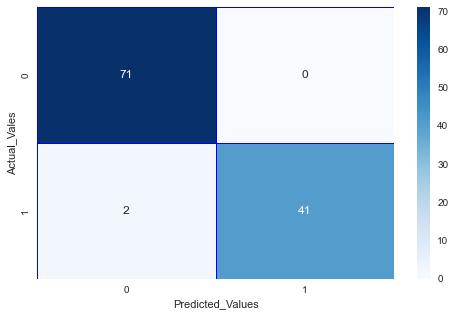

In [ ]:
# show confusion matrix to assess the algorithm performance
cm = confusion_matrix(y_test , y_pred)
f , ax = plt.subplots(figsize = (8,5))
sns.heatmap(cm , ax = ax , annot=True , cmap="Blues" , linecolor="Blue" , linewidths=0.5 , fmt=".0f")
plt.xlabel("Predicted_Values")
plt.ylabel("Actual_Vales")
plt.show()

# III- pca -- KNN (14 features)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

# Normalize the data
scaler = StandardScaler()
X = scaler.fit_transform(data)

# Apply PCA
pca = PCA(n_components=14)
X = pca.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, target, test_size=0.2, random_state=42)

# Instantiate a KNN classifier and fit it to your transformed training data
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)

# Use the KNN classifier to predict the labels of your transformed testing data
y_pred = knn.predict(X_test)

# Calculate the accuracy of your KNN classifier
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy: {:.2f}%".format(accuracy * 100))

Accuracy: 94.74%


C:\Users\FreeComp\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


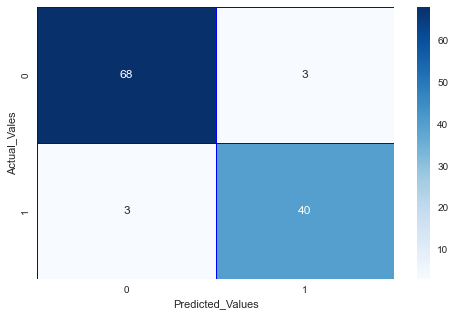

In [ ]:
# show confusion matrix to assess the algorithm performance
cm = confusion_matrix(y_test , y_pred)
f , ax = plt.subplots(figsize = (8,5))
sns.heatmap(cm , ax = ax , annot=True , cmap="Blues" , linecolor="Blue" , linewidths=0.5 , fmt=".0f")
plt.xlabel("Predicted_Values")
plt.ylabel("Actual_Vales")
plt.show()

# IV-- pca -- Decision Tree (14 features)

In [ ]:
from sklearn.tree import DecisionTreeClassifier

# Normalize the data
scaler = StandardScaler()
X = scaler.fit_transform(data)

# Apply PCA
pca = PCA(n_components=14)
X = pca.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, target, test_size=0.2, random_state=42)

# Instantiate a KNN classifier and fit it to your transformed training data
DT = DecisionTreeClassifier()
DT.fit(X_train, y_train)

# Use the KNN classifier to predict the labels of your transformed testing data
y_pred = DT.predict(X_test)

# Calculate the accuracy of your KNN classifier
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy: {:.2f}%".format(accuracy * 100))

Accuracy: 94.74%


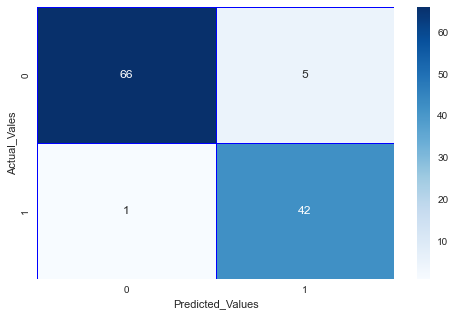

In [ ]:
# show confusion matrix to assess the algorithm performance
cm = confusion_matrix(y_test , y_pred)
f , ax = plt.subplots(figsize = (8,5))
sns.heatmap(cm , ax = ax , annot=True , cmap="Blues" , linecolor="Blue" , linewidths=0.5 , fmt=".0f")
plt.xlabel("Predicted_Values")
plt.ylabel("Actual_Vales")
plt.show()

# IIV-  pca -- Naive Bayes ( 14features )

In [ ]:
# import library Naive Bayes Gaussian
from sklearn.naive_bayes import GaussianNB

# Normalize the data
scaler = StandardScaler()
X = scaler.fit_transform(data)

# Apply PCA
pca = PCA(n_components=14)
X = pca.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, target, test_size=0.2, random_state=42)

# Instantiate a KNN classifier and fit it to your transformed training data
NB = GaussianNB()
NB.fit(X_train, y_train)

# Use the KNN classifier to predict the labels of your transformed testing data
y_pred = NB.predict(X_test)

# Calculate the accuracy of your KNN classifier
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy: {:.2f}%".format(accuracy * 100))

Accuracy: 93.86%


C:\Users\FreeComp\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


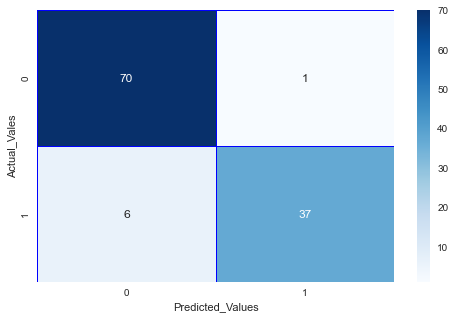

In [ ]:
# show confusion matrix to assess the algorithm performance
cm = confusion_matrix(y_test , y_pred)
f , ax = plt.subplots(figsize = (8,5))
sns.heatmap(cm , ax = ax , annot=True , cmap="Blues" , linecolor="Blue" , linewidths=0.5 , fmt=".0f")
plt.xlabel("Predicted_Values")
plt.ylabel("Actual_Vales")
plt.show()

# pca -- Random Forest ( 14 features )  

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Normalize the data
scaler = StandardScaler()
X = scaler.fit_transform(data)

# Apply PCA
pca = PCA(n_components=14)
X = pca.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, target, test_size=0.2, random_state=42)

# Instantiate a KNN classifier and fit it to your transformed training data
RF = RandomForestClassifier()
RF.fit(X_train, y_train)

# Use the KNN classifier to predict the labels of your transformed testing data
y_pred = RF.predict(X_test)

# Calculate the accuracy of your KNN classifier
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy: {:.2f}%".format(accuracy * 100))

C:\Users\FreeComp\anaconda3\lib\site-packages\ipykernel_launcher.py:16: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  app.launch_new_instance()


Accuracy: 95.61%


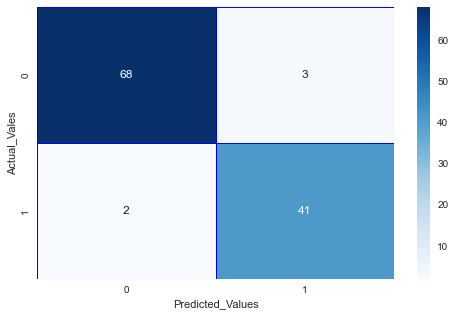

In [ ]:
# show confusion matrix to assess the algorithm performance
cm = confusion_matrix(y_test , y_pred)
f , ax = plt.subplots(figsize = (8,5))
sns.heatmap(cm , ax = ax , annot=True , cmap="Blues" , linecolor="Blue" , linewidths=0.5 , fmt=".0f")
plt.xlabel("Predicted_Values")
plt.ylabel("Actual_Vales")
plt.show()

In [ ]:
from yellowbrick.classifier import ClassificationReport
from yellowbrick.classifier import ConfusionMatrix

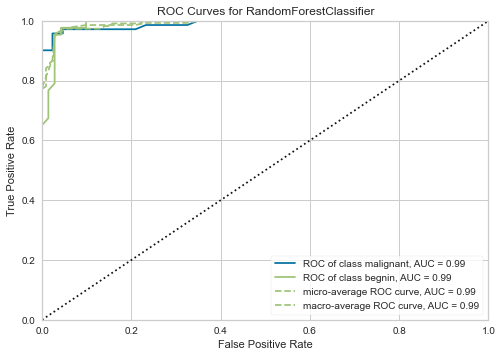

<AxesSubplot:title={'center':'ROC Curves for RandomForestClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [ ]:
from yellowbrick.classifier import ROCAUC
from yellowbrick.datasets import load_spam


# Instantiate the visualizer with the classification model
#model = LogisticRegression(multi_class="auto", solver="liblinear")
visualizer = ROCAUC(RF, classes=["malignant", "begnin"])

visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show()                       # Finalize and show the figure

C:\Users\FreeComp\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


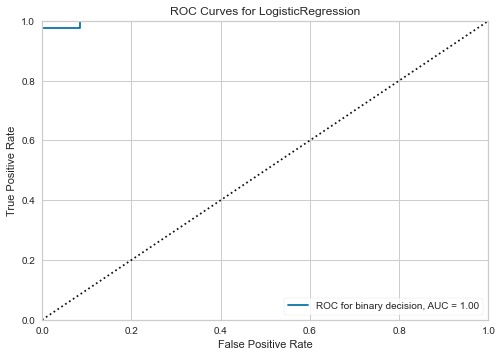

C:\Users\FreeComp\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


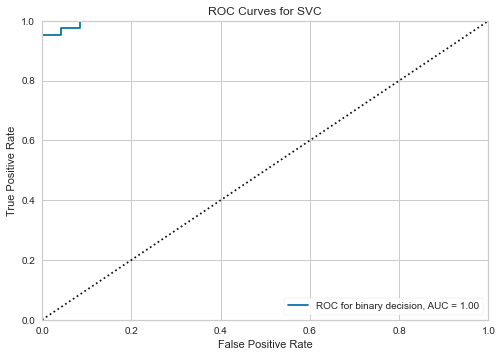

C:\Users\FreeComp\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


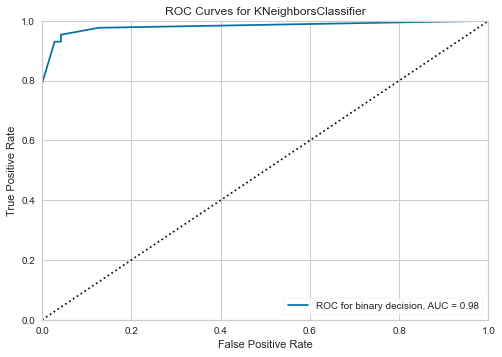

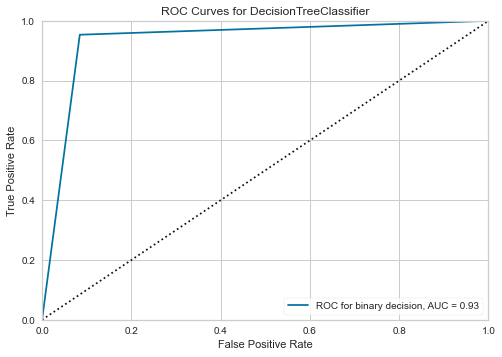

C:\Users\FreeComp\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


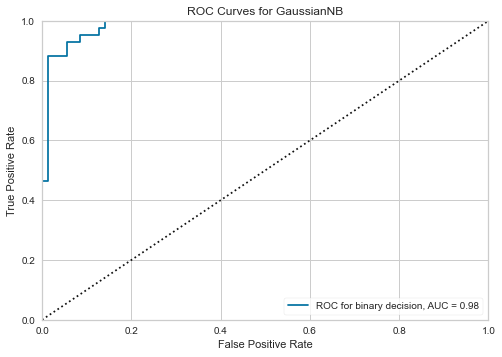

C:\Users\FreeComp\anaconda3\lib\site-packages\yellowbrick\base.py:390: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.estimator.fit(X, y, **kwargs)


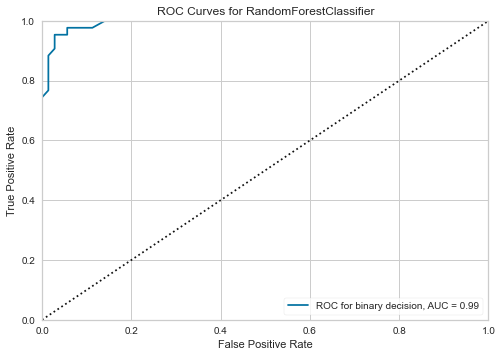

In [ ]:
from yellowbrick.classifier import ROCAUC

# Define the classifiers to use
classifiers = [
    LogisticRegression(random_state=42),
    SVC(),
    KNeighborsClassifier(),
    DecisionTreeClassifier(),
    GaussianNB(),
    RandomForestClassifier()
]

# Train and score each classifier, and plot the ROC curve
for clf in classifiers:
    visualizer = ROCAUC(clf ,classes=["malignant", "begnin"],micro=False, macro=False, per_class=False )
    visualizer.fit(X_train, y_train)
    visualizer.score(X_test, y_test )
    visualizer.show()

C:\Users\FreeComp\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


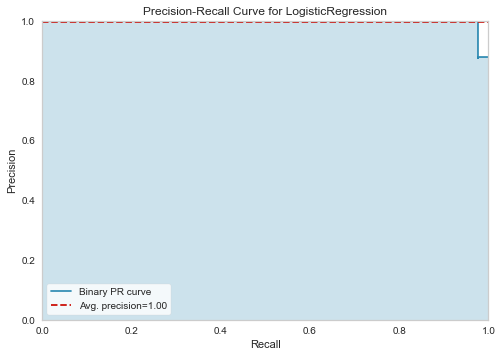

C:\Users\FreeComp\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


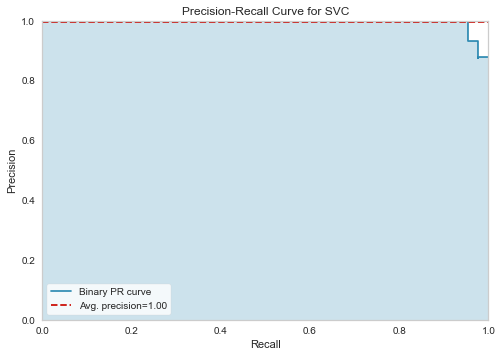

C:\Users\FreeComp\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


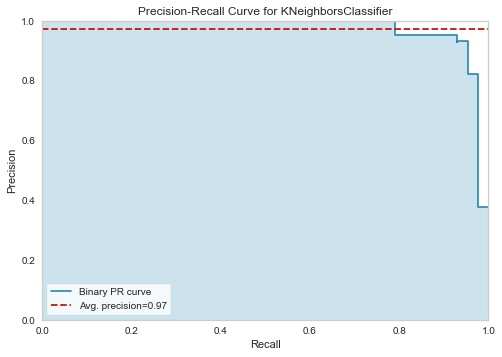

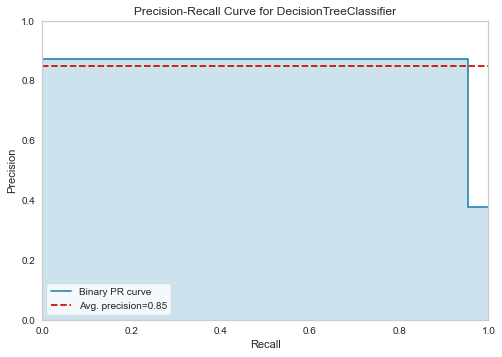

C:\Users\FreeComp\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


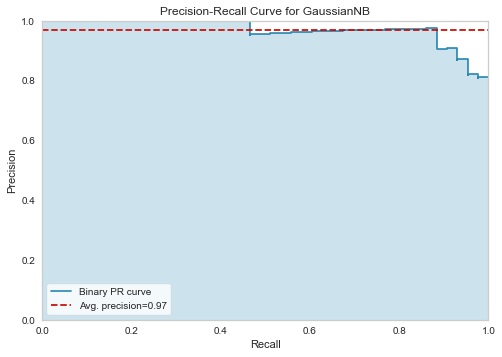

C:\Users\FreeComp\anaconda3\lib\site-packages\yellowbrick\base.py:390: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.estimator.fit(X, y, **kwargs)


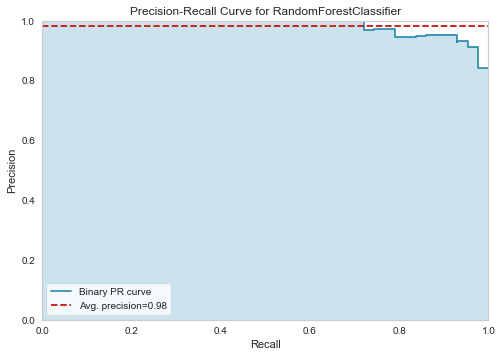

In [ ]:
from yellowbrick.classifier import PrecisionRecallCurve

# Define the classifiers to use
classifiers = [
    LogisticRegression(random_state=42),
    SVC(),
    KNeighborsClassifier(),
    DecisionTreeClassifier(),
    GaussianNB(),
    RandomForestClassifier()
]

# Train and score each classifier, and plot the ROC curve
for clf in classifiers:
    visualizer = PrecisionRecallCurve(clf ,micro=False, macro=False, per_class=False )
    visualizer.fit(X_train, y_train)
    visualizer.score(X_test, y_test )
    visualizer.show()

In [ ]:
# I-    pca -- logistic regression  (14 features)

# I-    pca -- logistic regression  (8 features)

In [ ]:
# Load iris dataset

data = new_data[: , 1:]
target = new_data[: , 0:1]
# Normalize the data
scaler = StandardScaler()
X = scaler.fit_transform(data)

# Apply PCA to reduce dimensionality
pca = PCA(n_components=8)
X_pca = pca.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_pca,target , test_size=0.3, random_state=42)

# Fit the Logistic Regression model to the training set
clf = LogisticRegression(random_state=42)
clf.fit(X_train, y_train)

# Evaluate the performance of the model on the testing set
score = clf.score(X_test, y_test)
print("Accuracy: {:.2f}%".format(score * 100))

Accuracy: 99.42%


C:\Users\FreeComp\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
# II- pca -- Support Vector Machine (14 features)

# II- pca -- Support Vector Machine (8 features)

In [ ]:
from sklearn.svm import SVC

# Normalize the data
scaler = StandardScaler()
X = scaler.fit_transform(data)

# Apply PCA
pca = PCA(n_components=8)
X = pca.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, target, test_size=0.2, random_state=42)

# Fit the SVM model to the training set
svm = SVC()
svm.fit(X_train, y_train)

# Evaluate the performance of the model on the testing set
y_pred = svm.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: {:.2f}%".format(accuracy * 100))

Accuracy: 96.49%


C:\Users\FreeComp\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


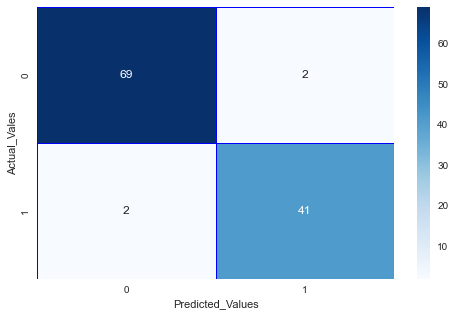

In [ ]:
# show confusion matrix to assess the algorithm performance
cm = confusion_matrix(y_test , y_pred)
f , ax = plt.subplots(figsize = (8,5))
sns.heatmap(cm , ax = ax , annot=True , cmap="Blues" , linecolor="Blue" , linewidths=0.5 , fmt=".0f")
plt.xlabel("Predicted_Values")
plt.ylabel("Actual_Vales")
plt.show()

In [ ]:
# III- pca -- KNN (14 features)

# III- pca -- KNN (8 features)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

# Normalize the data
scaler = StandardScaler()
X = scaler.fit_transform(data)

# Apply PCA
pca = PCA(n_components=8)
X = pca.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, target, test_size=0.2, random_state=42)

# Instantiate a KNN classifier and fit it to your transformed training data
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)

# Use the KNN classifier to predict the labels of your transformed testing data
y_pred = knn.predict(X_test)

# Calculate the accuracy of your KNN classifier
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy: {:.2f}%".format(accuracy * 100))

Accuracy: 95.61%


C:\Users\FreeComp\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


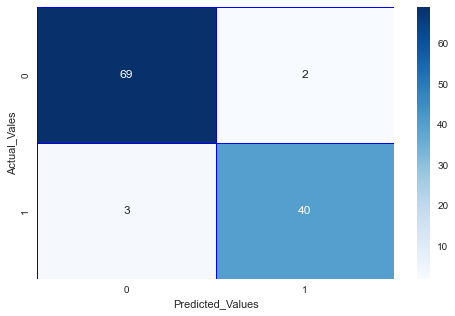

In [ ]:
# show confusion matrix to assess the algorithm performance
cm = confusion_matrix(y_test , y_pred)
f , ax = plt.subplots(figsize = (8,5))
sns.heatmap(cm , ax = ax , annot=True , cmap="Blues" , linecolor="Blue" , linewidths=0.5 , fmt=".0f")
plt.xlabel("Predicted_Values")
plt.ylabel("Actual_Vales")
plt.show()

# IV-- pca -- Decision Tree (8 features)

In [ ]:
from sklearn.tree import DecisionTreeClassifier

# Normalize the data
scaler = StandardScaler()
X = scaler.fit_transform(data)

# Apply PCA
pca = PCA(n_components=8)
X = pca.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, target, test_size=0.2, random_state=42)

# Instantiate a KNN classifier and fit it to your transformed training data
DT = DecisionTreeClassifier()
DT.fit(X_train, y_train)

# Use the KNN classifier to predict the labels of your transformed testing data
y_pred = DT.predict(X_test)

# Calculate the accuracy of your KNN classifier
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy: {:.2f}%".format(accuracy * 100))

Accuracy: 94.74%


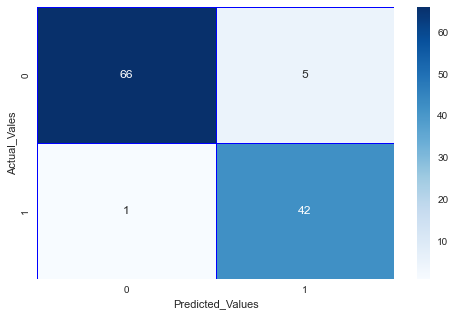

In [ ]:
# show confusion matrix to assess the algorithm performance
cm = confusion_matrix(y_test , y_pred)
f , ax = plt.subplots(figsize = (8,5))
sns.heatmap(cm , ax = ax , annot=True , cmap="Blues" , linecolor="Blue" , linewidths=0.5 , fmt=".0f")
plt.xlabel("Predicted_Values")
plt.ylabel("Actual_Vales")
plt.show()

In [ ]:
# IIV-  pca -- Naive Bayes ( 8features )

# IIV-  pca -- Naive Bayes ( 8features )

In [ ]:
# import library Naive Bayes Gaussian
from sklearn.naive_bayes import GaussianNB

# Normalize the data
scaler = StandardScaler()
X = scaler.fit_transform(data)

# Apply PCA
pca = PCA(n_components=8)
X = pca.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, target, test_size=0.2, random_state=42)

# Instantiate a KNN classifier and fit it to your transformed training data
NB = GaussianNB()
NB.fit(X_train, y_train)

# Use the KNN classifier to predict the labels of your transformed testing data
y_pred = NB.predict(X_test)

# Calculate the accuracy of your KNN classifier
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy: {:.2f}%".format(accuracy * 100))

Accuracy: 92.11%


C:\Users\FreeComp\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


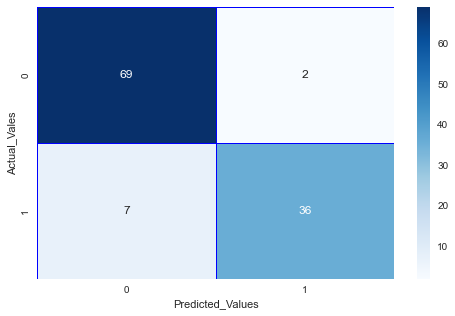

In [ ]:
# show confusion matrix to assess the algorithm performance
cm = confusion_matrix(y_test , y_pred)
f , ax = plt.subplots(figsize = (8,5))
sns.heatmap(cm , ax = ax , annot=True , cmap="Blues" , linecolor="Blue" , linewidths=0.5 , fmt=".0f")
plt.xlabel("Predicted_Values")
plt.ylabel("Actual_Vales")
plt.show()

# pca -- Random Forest ( 8 features )  

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Normalize the data
scaler = StandardScaler()
X = scaler.fit_transform(data)

# Apply PCA
pca = PCA(n_components=14)
X = pca.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, target, test_size=0.2, random_state=42)

# Instantiate a KNN classifier and fit it to your transformed training data
RF = RandomForestClassifier()
RF.fit(X_train, y_train)

# Use the KNN classifier to predict the labels of your transformed testing data
y_pred = RF.predict(X_test)

# Calculate the accuracy of your KNN classifier
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy: {:.2f}%".format(accuracy * 100))

C:\Users\FreeComp\anaconda3\lib\site-packages\ipykernel_launcher.py:16: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  app.launch_new_instance()


Accuracy: 94.74%


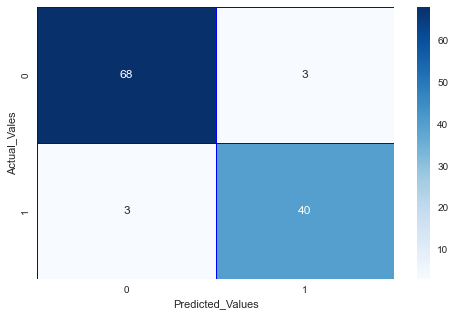

In [ ]:
# show confusion matrix to assess the algorithm performance
cm = confusion_matrix(y_test , y_pred)
f , ax = plt.subplots(figsize = (8,5))
sns.heatmap(cm , ax = ax , annot=True , cmap="Blues" , linecolor="Blue" , linewidths=0.5 , fmt=".0f")
plt.xlabel("Predicted_Values")
plt.ylabel("Actual_Vales")
plt.show()

# ROCAUC FOR ALL ALGORITHMS 

C:\Users\FreeComp\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


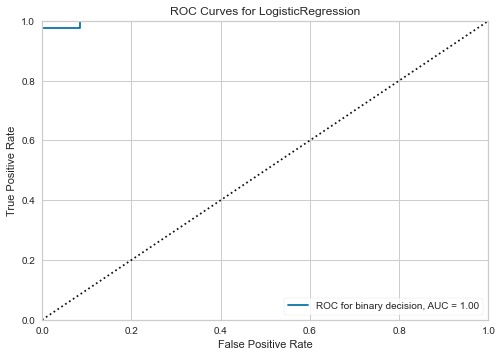

C:\Users\FreeComp\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


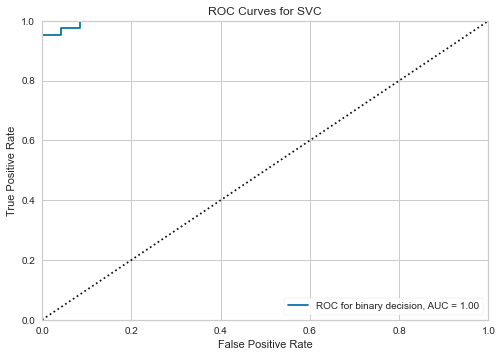

C:\Users\FreeComp\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


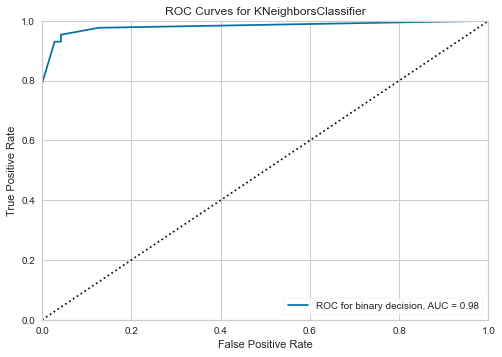

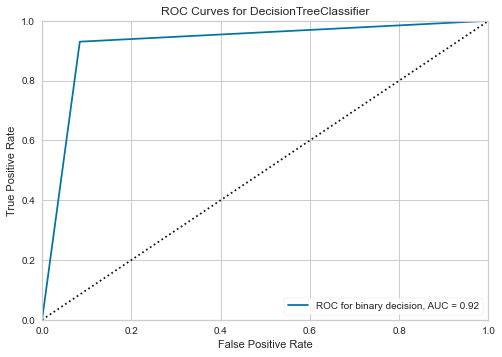

C:\Users\FreeComp\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


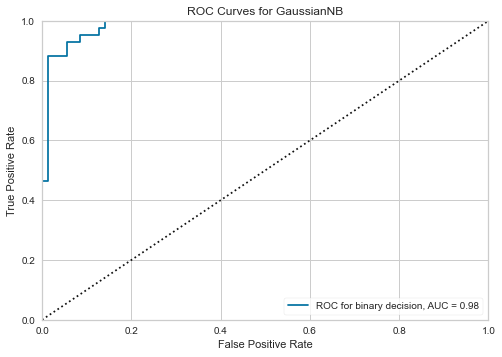

C:\Users\FreeComp\anaconda3\lib\site-packages\yellowbrick\base.py:390: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.estimator.fit(X, y, **kwargs)


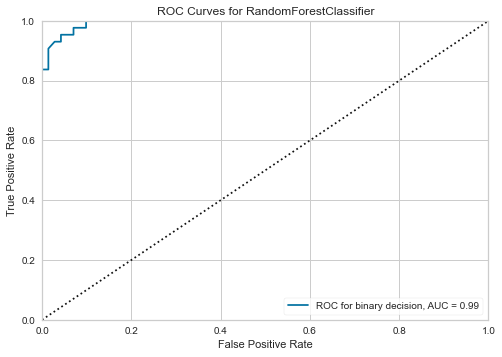

In [ ]:
from yellowbrick.classifier import ROCAUC

# Define the classifiers to use
classifiers = [
    LogisticRegression(random_state=42),
    SVC(),
    KNeighborsClassifier(),
    DecisionTreeClassifier(),
    GaussianNB(),
    RandomForestClassifier()
]

# Train and score each classifier, and plot the ROC curve
for clf in classifiers:
    visualizer = ROCAUC(clf ,classes=["malignant", "begnin"],micro=False, macro=False, per_class=False )
    visualizer.fit(X_train, y_train)
    visualizer.score(X_test, y_test )
    visualizer.show()

# PrecisionRecallCurve For All Algorithms

C:\Users\FreeComp\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


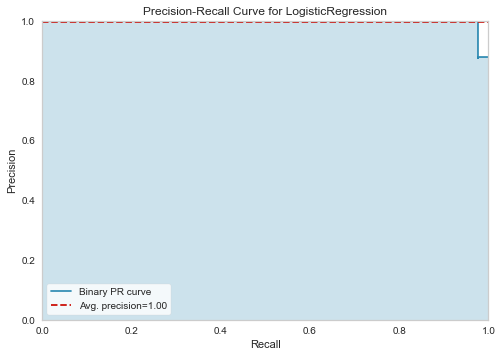

C:\Users\FreeComp\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


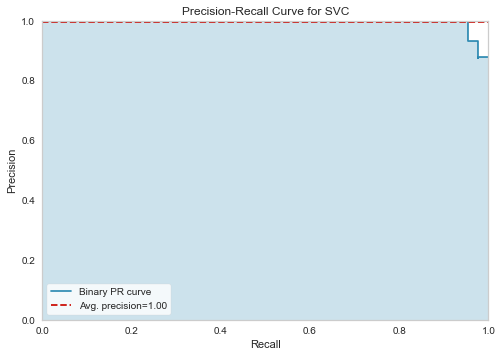

C:\Users\FreeComp\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


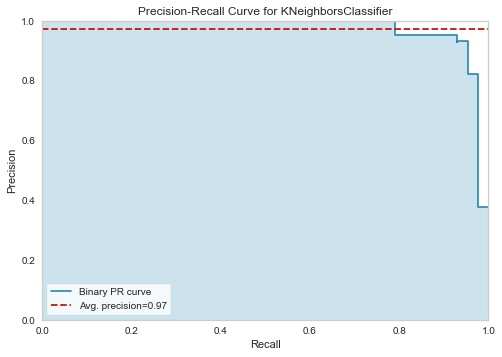

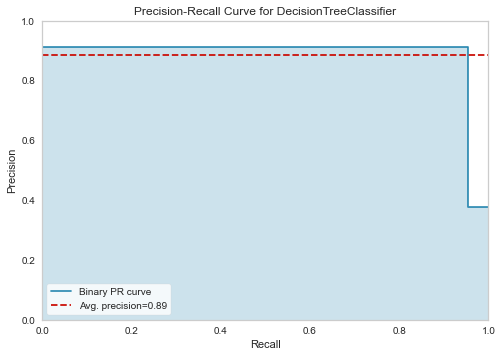

C:\Users\FreeComp\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


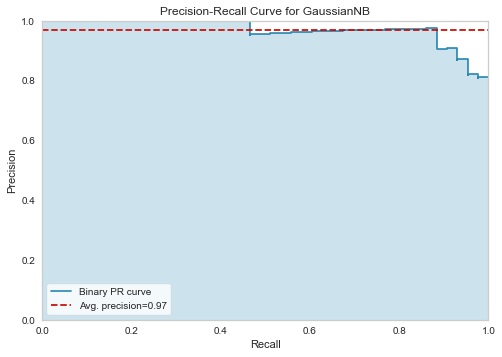

C:\Users\FreeComp\anaconda3\lib\site-packages\yellowbrick\base.py:390: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.estimator.fit(X, y, **kwargs)


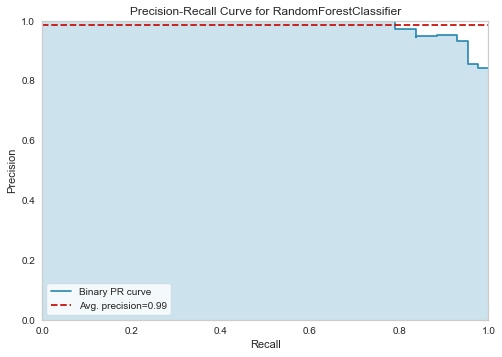

In [ ]:
from yellowbrick.classifier import PrecisionRecallCurve

# Define the classifiers to use
classifiers = [
    LogisticRegression(random_state=42),
    SVC(),
    KNeighborsClassifier(),
    DecisionTreeClassifier(),
    GaussianNB(),
    RandomForestClassifier()
]

# Train and score each classifier, and plot the ROC curve
for clf in classifiers:
    visualizer = PrecisionRecallCurve(clf ,micro=False, macro=False, per_class=False )
    visualizer.fit(X_train, y_train)
    visualizer.score(X_test, y_test )
    visualizer.show()

# Ensample Learning

Accuracy: 98.24561403508771
ROC AUC score: <function roc_auc_score at 0x0000013EC6FC2EE8>


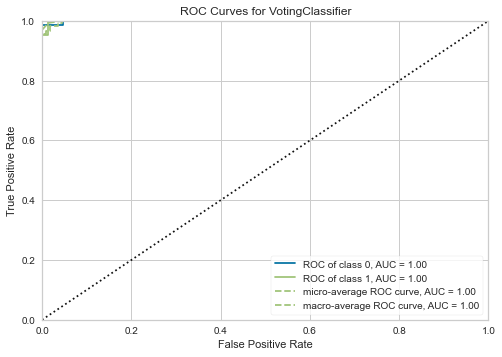

<AxesSubplot:title={'center':'ROC Curves for VotingClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [ ]:
from sklearn.ensemble import VotingClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from yellowbrick.classifier import ROCAUC
from sklearn.metrics import accuracy_score, roc_auc_score, plot_roc_curve
import matplotlib.pyplot as plt

# Load dataset
data = new_data[:, 1:]

# Normalize the data
scaler = StandardScaler()
transform = scaler.fit_transform(data)

# Apply PCA to reduce dimensionality
pca = PCA(n_components=14)
X_pca_svm = pca.fit_transform(transform)

# Apply PCA to reduce dimensionality
pca = PCA(n_components=8)
X_pca_lg = pca.fit_transform(transform)

combien = np.hstack((X_pca_svm, X_pca_lg))

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(combien, y, test_size=0.2, random_state=42)

# Create a logistic regression classifier with SelectFromModel feature selection using RandomForestClassifier
lr_rfc = Pipeline([
    ('selector', SelectFromModel(RandomForestClassifier())),
    ('lr', LogisticRegression())
])

# Create an SVM classifier with SelectFromModel feature selection using RandomForestClassifier
svm_rfc = Pipeline([
    ('selector', SelectFromModel(RandomForestClassifier())),
    ('svm', SVC(kernel='linear', C=1.0, probability=True))
])

# Instantiate the ensemble classifier with LR and SVM classifiers using 'soft' voting strategy
ensemble = VotingClassifier(estimators=[
    ('lr_rfc', lr_rfc),
    ('svm_rfc', svm_rfc)
], voting='soft')

# Fit the ensemble classifier on the training data
ensemble.fit(X_train, y_train)

# Predict on the test data
y_pred = ensemble.predict(X_test)

# Calculate the accuracy score
accuracy = accuracy_score(y_test, y_pred)*100

# Calculate the ROC AUC score
y_pred_proba = ensemble.predict_proba(X_test)[:,1]
#roc_auc = roc_auc_score(y_test, y_pred_proba)

# Print the accuracy and ROC AUC score
print("Accuracy:", accuracy)
print("ROC AUC score:", roc_auc_score)

# Create the ROC curve visualization
visualizer = ROCAUC(ensemble)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show()

Average Precision: 0.9989306258911452


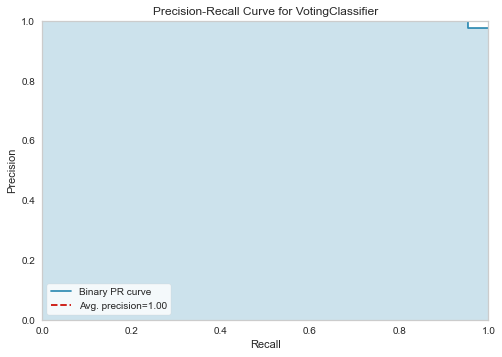

<AxesSubplot:title={'center':'Precision-Recall Curve for VotingClassifier'}, xlabel='Recall', ylabel='Precision'>

In [ ]:
from sklearn.metrics import accuracy_score, roc_auc_score, plot_roc_curve, precision_recall_curve, average_precision_score
# Calculate the precision and recall scores
precision, recall, thresholds = precision_recall_curve(y_test, y_pred_proba)
average_precision = average_precision_score(y_test, y_pred_proba)

print("Average Precision:", average_precision)

# Create the precision-recall curve visualization
visualizer = PrecisionRecallCurve(ensemble)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show()

# Group 2 (Mohamed Baher , Nourhan Elsabawy , Alaa Elnakeeb )

In [ ]:
import pickle
pickle.dump(logmode , open('logmode.pkl' , 'wb'))
model = pickle.load(open('logmode.pkl' , 'rb'))

# Make a prediction on new input data
input_data = np.array([[17.99,10.38,122.8,1001,0.1184,0.2776,0.3001,0.1471,0.2419,0.07871,1.095,0.9053,8.589,153.4,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.6,2019,0.1622,0.6656,0.7119,0.2654,0.4601,0.1189]])
prediction = model.predict(input_data)

# Print the prediction
print(prediction)

[1]
